In [ ]:
import os
import json
import xml.etree.ElementTree as ET
from tqdm import tqdm

def load_split_file(split_file):
    """Load filenames from a trainval or test split file."""
    with open(split_file, "r") as f:
        return set(line.strip() for line in f.readlines())

def convert_voc_to_coco(xml_dir, img_dir, split_file, output_json, max_samples=None):
    # Initialize category_id to 1
    split_filenames = load_split_file(split_file)
    category_id = 1  # Start category IDs from 1
    categories = []
    annotations = []
    images = []
    category_set = {}
    annotation_id = 0
    image_id = 0
    missing_images = []
    images_without_annotations = []


    image_files = set(os.path.splitext(f)[0] for f in os.listdir(img_dir) if f.lower().endswith(('.jpg', '.jpeg')))
    # List all annotation files in the XML directory
    annotation_files = set(os.path.splitext(f)[0] for f in os.listdir(xml_dir) if f.lower().endswith('.xml'))

    # Match images with annotations by comparing filenames
    matched_images = list(image_files.intersection(annotation_files))


    if max_samples is not None:
        matched_images = matched_images[:max_samples]

    print(f"Total images in the directory: {len(image_files)}")
    print(f"Total annotations in the directory: {len(annotation_files)}")
    print(f"Matched images: {len(matched_images)}")

    for xml_file in tqdm(os.listdir(xml_dir)):
        if not xml_file.endswith(".xml"):
            continue

        filename = os.path.splitext(xml_file)[0]
        if filename not in matched_images:
            continue  # Skip images not in the sampled set

        xml_path = os.path.join(xml_dir, xml_file)


        try:
            tree = ET.parse(xml_path)
            root = tree.getroot()
        except ET.ParseError as e:
            print(f"Error parsing XML file: {xml_file}")  # Print the problematic filename
            print(e)  # Print the original error message
            continue  # Skip this file and move to the next one

        # Extract image info
        img_path = os.path.join(img_dir, filename + ".jpg")
        if not os.path.exists(img_path):
            img_path = os.path.join(img_dir, filename + ".jpeg")

        if not os.path.exists(img_path):
            print(f"Image {filename} not found, skipping.")
            missing_images.append(filename)  # Track missing images
            continue

        width = int(root.find("size/width").text)
        height = int(root.find("size/height").text)

        # Extract annotations
        image_annotations = []
        for obj in root.findall("object"):
            category = obj.find("name").text
            if category not in category_set:
                category_set[category] = category_id  # category_id should be an integer
                categories.append({
                    "id": category_id,
                    "name": category,
                })
                category_id += 1


            annotation = {
                "id": annotation_id,
                "image_id": image_id,
                "category_id": category_set[category],
                "iscrowd": 0,
            }

            # Extract bounding box
            bndbox = obj.find("bndbox")
            xmin = int(float(bndbox.find("xmin").text))
            ymin = int(float(bndbox.find("ymin").text))
            xmax = int(float(bndbox.find("xmax").text))
            ymax = int(float(bndbox.find("ymax").text))
            width_bbox = xmax - xmin
            height_bbox = ymax - ymin
            annotation["bbox"] = [xmin, ymin, width_bbox, height_bbox]
            annotation["area"] = width_bbox * height_bbox

            # Extract segmentation mask (if available) as well
            if obj.find("segmentation") is not None:
                segmentation = []
                # Check for polygon-based segmentation
                for polygon in obj.find("segmentation").findall("polygon"):
                    for point in polygon.findall("pt"):
                        x = int(float(point.find("x").text))
                        y = int(float(point.find("y").text))
                        segmentation.extend([x, y])
                # Check for point-based segmentation (if polygon not found)
                if not segmentation:  # If segmentation is empty (no polygons)
                    for point in obj.find("segmentation").findall("point"):
                        x = int(float(point.find("x").text))
                        y = int(float(point.find("y").text))
                        segmentation.extend([x, y])
                annotation["segmentation"] = [segmentation]  # Add segmentation mask

            image_annotations.append(annotation)
            annotation_id += 1

        if image_annotations:  # only add the image if there are annotations
            images.append({
                "file_name": filename + ".jpg",
                "height": height,
                "width": width,
                "id": image_id,
            })
            annotations.extend(image_annotations)
        else:
            images_without_annotations.append(filename)

        image_id += 1

    # Save to COCO format
    coco_dict = {
        "images": images,
        "annotations": annotations,
        "categories": categories,
    }

    with open(output_json, "w") as f:
        json.dump(coco_dict, f)
    print(f"COCO annotations saved to {output_json}")

    # Report missing images and images without annotations
    if missing_images:
        print(f"\nMissing images: {len(missing_images)}")
        print(missing_images)

    if images_without_annotations:
        print(f"\nImages without annotations: {len(images_without_annotations)}")
        print(images_without_annotations)


# Example usage:
convert_voc_to_coco(
    xml_dir="/content/drive/MyDrive/Colab Notebooks/Annotations/",
    img_dir="/content/drive/MyDrive/Colab Notebooks/JPEGImages/",
    split_file="/content/drive/MyDrive/Colab Notebooks/trainval.txt",
    output_json="/content/drive/MyDrive/Colab Notebooks/trainval_annotations.json",
    max_samples=500  # Limit to 500 images
)

convert_voc_to_coco(
    xml_dir="/content/drive/MyDrive/Colab Notebooks/Annotations/",
    img_dir="/content/drive/MyDrive/Colab Notebooks/JPEGImages/",
    split_file="/content/drive/MyDrive/Colab Notebooks/test.txt",
    output_json="/content/drive/MyDrive/Colab Notebooks/test_annotations.json",
    max_samples=500  # Limit to 500 images
)

Total images in the directory: 7199
Total annotations in the directory: 4401
Matched images: 500


100%|██████████| 4404/4404 [01:59<00:00, 36.83it/s]  


COCO annotations saved to /content/drive/MyDrive/Colab Notebooks/trainval_annotations.json
Total images in the directory: 7199
Total annotations in the directory: 4401
Matched images: 500


100%|██████████| 4404/4404 [00:02<00:00, 2196.54it/s]


COCO annotations saved to /content/drive/MyDrive/Colab Notebooks/test_annotations.json


In [ ]:
#check if category 0
import json

# Load the generated JSON
with open("/content/drive/MyDrive/Colab Notebooks/trainval_annotations.json", "r") as f:
    data = json.load(f)

annotation_ids = {ann["category_id"] for ann in data["annotations"]}
print(f"Unique category IDs in annotations: {sorted(annotation_ids)}")

category_ids = {cat["id"] for cat in data["categories"]}
print(f"Category IDs in categories: {sorted(category_ids)}")


Unique category IDs in annotations: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]
Category IDs in categories: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]


In [ ]:
!pip install --upgrade protobuf

  Using cached protobuf-5.29.3-cp38-abi3-manylinux2014_x86_64.whl.metadata (592 bytes)
Using cached protobuf-5.29.3-cp38-abi3-manylinux2014_x86_64.whl (319 kB)
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.19.6
    Uninstalling protobuf-3.19.6:
      Successfully uninstalled protobuf-3.19.6
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.18.0 requires tensorboard<2.19,>=2.18, but you have tensorboard 2.10.1 which is incompatible.
tensorboard 2.10.1 requires protobuf<3.20,>=3.9.2, but you have protobuf 5.29.3 which is incompatible.
tf-keras 2.17.0 requires tensorflow<2.18,>=2.17, but you have tensorflow 2.18.0 which is incompatible.


In [ ]:
!pip install -U detectron2
!pip install --upgrade --force-reinstall fvcore
!pip install --upgrade --force-reinstall 'git+https://github.com/facebookresearch/detectron2.git'
!pip install numpy==1.24.3
!pip install --upgrade cupy-cuda12x gensim langchain numba pandas-gbq pytensor tensorflow tensorflow-datasets thinc
!pip install -U "tensorboard<2.11"


ERROR: Could not find a version that satisfies the requirement detectron2 (from versions: none)
ERROR: No matching distribution found for detectron2
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 1.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 731.5 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.7/57.7 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 3.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 763.0/763.0 kB 27.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 84.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 86.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 kB 6.5 MB/s eta 0:00:00
  Created wheel for fvcore: filename=fvcore-0.1.5.post20221221-py3-none-any.whl size=61396 sha256=eecbc1ca171150795279ee5bd264b3776a

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-f9ufi6ps
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-f9ufi6ps
  Resolved https://github.com/facebookresearch/detectron2.git to commit 9604f5995cc628619f0e4fd913453b4d7d61db3f
  Preparing metadata (setup.py) ... done
  Using cached pillow-11.1.0-cp311-cp311-manylinux_2_28_x86_64.whl.metadata (9.1 kB)
  Using cached termcolor-2.5.0-py3-none-any.whl.metadata (6.1 kB)
  Using cached yacs-0.1.8-py3-none-any.whl.metadata (639 bytes)
  Using cached tabulate-0.9.0-py3-none-any.whl.metadata (34 kB)
  Using cached tqdm-4.67.1-py3-none-any.whl.metadata (57 kB)
  Using cached fvcore-0.1.5.post20221221-py3-none-any.whl
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.2/79.2 kB 3.3 MB/s eta 0:00:00
  Using cached numpy-2.2.2-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (62 kB)
  Using cached PyYAML-6.0.2-cp311-cp311

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 72.8 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.2.2
    Uninstalling numpy-2.2.2:
      Successfully uninstalled numpy-2.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pymc 5.19.1 requires numpy>=1.25.0, but you have numpy 1.24.3 which is incompatible.
tensorflow 2.17.1 requires protobuf!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<5.0.0dev,>=3.20.3, but you have protobuf 5.29.3 which is incompatible.
tensorflow 2.17.1 requires tensorboard<2.18,>=2.17, but you have tensorboard 2.18.0 which is incompatible.
albucore 0.0.19 requires numpy>=1.24.4, but you have numpy 1.24.3 which is incompatible.
albumentations 1.4.20 requires numpy>=1.24.4, but you have numpy 1.24.3 which is incompatible.
blosc2 3.0.0 requires numpy>=1.25.0, but you have numpy 1.24.

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 3.9 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of thinc to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.2/91.2 MB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 49.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 65.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 55.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 615.4/615.4 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 831.8/831.8 kB 39.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 412.4/412.4 kB 25.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.4/42.4 MB 14.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 77.9 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import json
import xml.etree.ElementTree as ET
from tqdm import tqdm
import cv2
import torch
import numpy as np
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.config import get_cfg
from detectron2.data.datasets import register_coco_instances
from detectron2.utils.visualizer import Visualizer
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
from detectron2.model_zoo import get_checkpoint_url
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.data import DatasetMapper, detection_utils as utils
from detectron2.data.transforms import ResizeShortestEdge, RandomFlip, RandomBrightness, RandomRotation
from detectron2.data.build import build_detection_train_loader
import matplotlib.pyplot as plt
#from detectron2.structures import AugInput, BitMasks
import detectron2.data.transforms as T
import locale
from detectron2.structures import BitMasks
from detectron2.data.transforms import AugInput

In [ ]:
# Remove the dataset from the MetadataCatalog if it exists if it exists due to multiple registeration due to runtime disconnection
if "ip102_train" in MetadataCatalog:
    MetadataCatalog.remove("ip102_train")
   # MetadataCatalog.pop("ip102_train")
if "ip102_test" in MetadataCatalog:
    MetadataCatalog.remove("ip102_test")
    # MetadataCatalog.pop("ip102_test")

DatasetCatalog.clear()

Visualizing Training Samples:


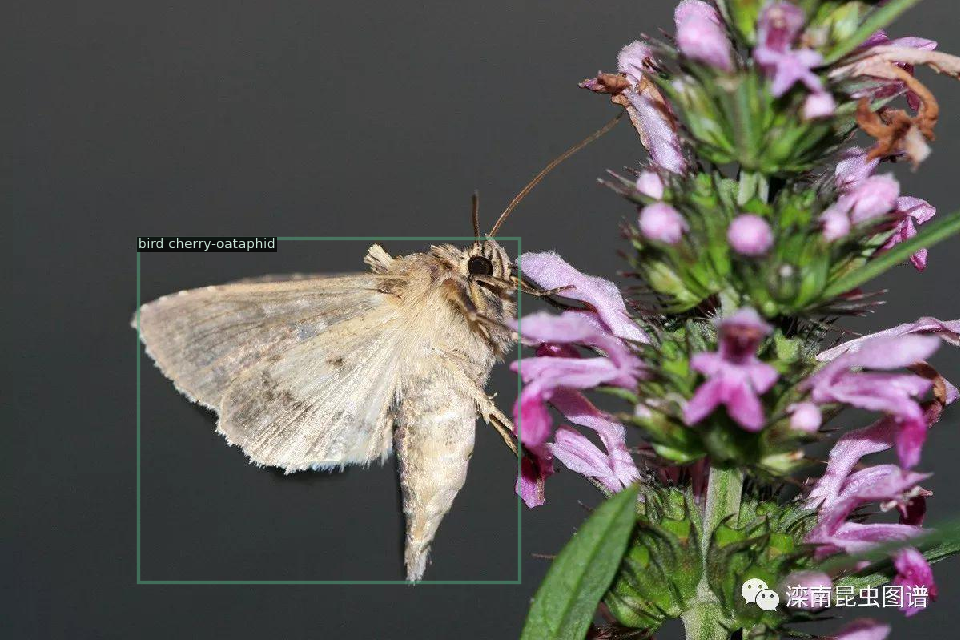

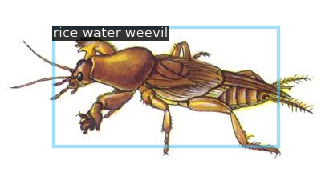


Visualizing Testing Samples:


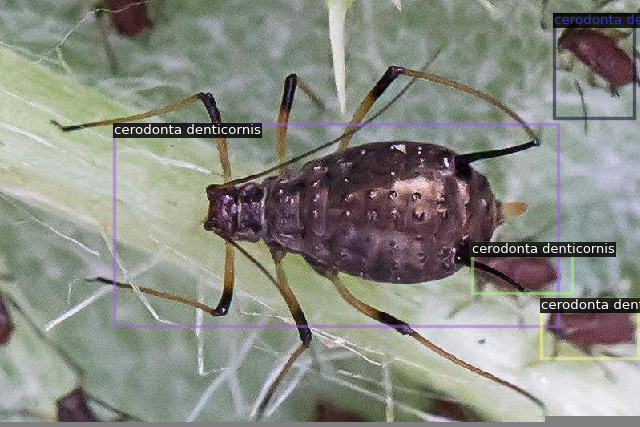

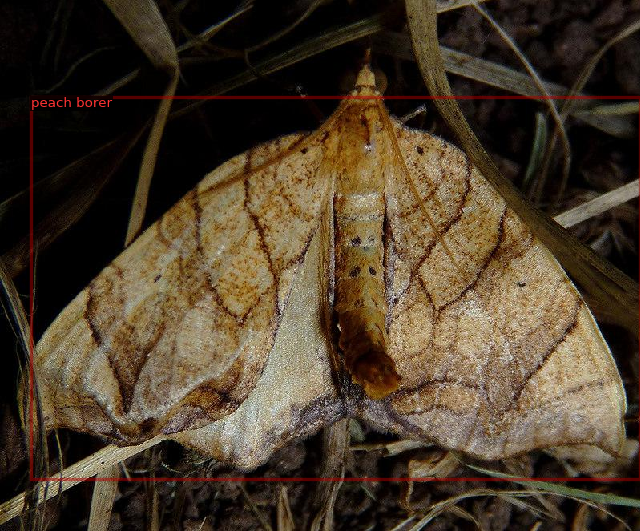

In [ ]:
from detectron2.data.datasets import register_coco_instances
from detectron2.data import MetadataCatalog, DatasetCatalog
import random
import cv2
import json
from google.colab.patches import cv2_imshow
import copy
import tempfile
import os
from detectron2.structures import BoxMode

# Define paths to annotations and images
ANNOTATIONS_TRAIN = "/content/drive/MyDrive/Colab Notebooks/trainval_annotations.json"
IMAGES_TRAIN = "/content/drive/MyDrive/Colab Notebooks/JPEGImages/"
ANNOTATIONS_VAL = "/content/drive/MyDrive/Colab Notebooks/test_annotations.json"
IMAGES_VAL = "/content/drive/MyDrive/Colab Notebooks/JPEGImages/"

# Create a mapping from numeric strings to category names
# Create a mapping from numeric strings to category names
numeric_string_to_name = {
        "1": "rice leaf roller",
        "2": "rice leaf caterpillar",
        "3": "paddy stem maggot",
        "4": "asiatic rice borer",
        "5": "yellow rice borer",
        "6": "rice gall midge",
        "7": "Rice Stemfly",
        "8": "brown plant hopper",
        "9": "white backed plant hopper",
        "10": "small brown plant hopper",
        "11": "rice water weevil",
        "12": "rice leafhopper",
        "13": "grain spreader thrips",
        "14": "rice shell pest",
        "15": "grub",
        "16": "mole cricket",
        "17": "wireworm",
        "18": "white margined moth",
        "19": "black cutworm",
        "20": "large cutworm",
        "21": "yellow cutworm",
        "22": "red spider",
        "23": "corn borer",
        "24": "army worm",
        "25": "aphids",
        "26": "Potosiabre vitarsis",
        "27": "peach borer",
        "28": "english grain aphid",
        "29": "green bug",
        "30": "bird cherry-oataphid",
        "31": "wheat blossom midge",
        "32": "penthaleus major",
        "33": "longlegged spider mite",
        "34": "wheat phloeothrips",
        "35": "wheat sawfly",
        "36": "cerodonta denticornis",
        "37": "beet fly",
        "38": "flea beetle",
        "39": "cabbage army worm",
        "40": "beet army worm",
        "41": "Beet spot flies",
        "42": "meadow moth",
        "43": "beet weevil",
        "44": "sericaorient alismots chulsky",
        "45": "alfalfa weevil",
        "46": "flax budworm",
        "47": "alfalfa plant bug",
        "48": "tarnished plant bug",
        "49": "Locustoidea",
        "50": "lytta polita",
        "51": "legume blister beetle",
        "52": "blister beetle",
        "53": "therioaphis maculata Buckton",
        "54": "odontothrips loti",
        "55": "Thrips",
        "56": "alfalfa seed chalcid",
        "57": "Pieris canidia",
        "58": "Apolygus lucorum",
        "59": "Limacodidae",
        "60": "Viteus vitifoliae",
        "61": "Colomerus vitis",
        "62": "Brevipoalpus lewisi McGregor",
        "63": "oides decempunctata",
        "64": "Polyphagotars onemus latus",
        "65": "Pseudococcus comstocki Kuwana",
        "66": "parathrene regalis",
        "67": "Ampelophaga",
        "68": "Lycorma delicatula",
        "69": "Xylotrechus",
        "70": "Cicadella viridis",
        "71": "Miridae",
        "72": "Trialeurodes vaporariorum",
        "73": "Erythroneura apicalis",
        "74": "Papilio xuthus",
        "75": "Panonchus citri McGregor",
        "76": "Phyllocoptes oleiverus ashmead",
        "77": "Icerya purchasi Mask",
        "78": "Unaspis yanonensis",
        "79": "Ceroplastes rubens",
        "80": "Chrysomphalus aonidum",
        "81": "Parlatoria zizyphus Lucus",
        "82": "Nipaecoccus vastalor",
        "83": "Aleurocanthus spiniferus",
        "84": "Tetradacus c Bactrocera minax",
        "85": "Dacus dorsalis(Hendel)",
        "86": "Bactrocera tsuneonis",
        "87": "Prodenia litura",
        "88": "Adristyrannus",
        "89": "Phyllocnistis citrella Stainton",
        "90": "Toxoptera citricidus",
        "91": "Toxoptera aurantii",
        "92": "Aphis citricola Vander Goot",
        "93": "Scirtothrips dorsalis Hood",
        "94": "Dasineura sp",
        "95": "Lawana imitata Melichar",
        "96": "Salurnis marginella Guerr",
        "97": "Deporaus marginatus Pascoe",
        "98": "Chlumetia transversa",
        "99": "Mango flat beak leafhopper",
        "100": "Rhytidodera bowrinii white",
        "101": "Sternochetus frigidus"
    }

# Register the datasets
for d in ["train", "val"]:
    DatasetCatalog.register("ip102_" + d, lambda d=d: get_ip102_dicts(IMAGES_TRAIN if d == "train" else IMAGES_VAL, ANNOTATIONS_TRAIN if d == "train" else ANNOTATIONS_VAL))
    MetadataCatalog.get("ip102_" + d).set(thing_classes=[numeric_string_to_name[str(i)] for i in range(1, len(numeric_string_to_name) + 1)])
ip102_metadata = MetadataCatalog.get("ip102_train")

def get_ip102_dicts(img_dir, annotation_file):
    """Load IP102 dataset annotations."""
    json_file = annotation_file
    with open(json_file) as f:
        imgs_anns = json.load(f)

    dataset_dicts = []
    for img_ann in imgs_anns['images']:
        record = {}

        filename = os.path.join(img_dir, img_ann["file_name"])
        height, width = cv2.imread(filename).shape[:2]

        record["file_name"] = filename
        record["image_id"] = img_ann['id']
        record["height"] = height
        record["width"] = width

        objs = []
        for anno in imgs_anns['annotations']:
            if anno['image_id'] == img_ann['id']:
                obj = {
                    "bbox": anno['bbox'],
                    "bbox_mode": BoxMode.XYWH_ABS,
                    "category_id": anno['category_id'],  # Use the category_id directly
                    "iscrowd": 0
                }
                objs.append(obj)

        record["annotations"] = objs
        dataset_dicts.append(record)

    return dataset_dicts

for d in ["train", "val"]:
    MetadataCatalog.get("ip102_" + d).set(
        thing_classes=[numeric_string_to_name[str(i)] for i in range(1, len(numeric_string_to_name) + 1)],
        image_root=IMAGES_TRAIN if d == "train" else IMAGES_VAL,
    )

# visualize some samples
def visualize_samples(dataset_name, num_samples=5):
    """Visualizes samples from the specified dataset."""
    metadata = MetadataCatalog.get(dataset_name)
    dataset_dicts = DatasetCatalog.get(dataset_name)
    num_samples = min(num_samples, len(dataset_dicts))

    for d in random.sample(dataset_dicts, num_samples):
        file_path = d.get("file_name")
        if file_path is not None:
            img = cv2.imread(file_path)

            if img is not None:
                visualizer = Visualizer(img[:, :, ::-1], metadata=metadata, scale=0.8)
                vis = visualizer.draw_dataset_dict(d)
                cv2_imshow(vis.get_image()[:, :, ::-1])
            else:
                print(f"Error: Could not load image from path {file_path}. Skipping.")
        else:
            print("Error: 'file_name' key not found in dataset dictionary. Skipping.")

print("Visualizing Training Samples:")
visualize_samples("ip102_train", num_samples=2)

print("\nVisualizing Testing Samples:")
visualize_samples("ip102_val",num_samples=2)


In [ ]:
from detectron2.data import MetadataCatalog

metadata_train = MetadataCatalog.get("ip102_train")
print(metadata_train.thing_classes)

['rice leaf roller', 'rice leaf caterpillar', 'paddy stem maggot', 'asiatic rice borer', 'yellow rice borer', 'rice gall midge', 'Rice Stemfly', 'brown plant hopper', 'white backed plant hopper', 'small brown plant hopper', 'rice water weevil', 'rice leafhopper', 'grain spreader thrips', 'rice shell pest', 'grub', 'mole cricket', 'wireworm', 'white margined moth', 'black cutworm', 'large cutworm', 'yellow cutworm', 'red spider', 'corn borer', 'army worm', 'aphids', 'Potosiabre vitarsis', 'peach borer', 'english grain aphid', 'green bug', 'bird cherry-oataphid', 'wheat blossom midge', 'penthaleus major', 'longlegged spider mite', 'wheat phloeothrips', 'wheat sawfly', 'cerodonta denticornis', 'beet fly', 'flea beetle', 'cabbage army worm', 'beet army worm', 'Beet spot flies', 'meadow moth', 'beet weevil', 'sericaorient alismots chulsky', 'alfalfa weevil', 'flax budworm', 'alfalfa plant bug', 'tarnished plant bug', 'Locustoidea', 'lytta polita', 'legume blister beetle', 'blister beetle', 

In [ ]:
from detectron2.data import MetadataCatalog, DatasetCatalog

print("Registered Datasets:", DatasetCatalog.list())
metadata_train = MetadataCatalog.get("ip102_train")
metadata_test = MetadataCatalog.get("ip102_val")
print("Training Categories:", metadata_train.thing_classes)
print("Testing Categories:", metadata_test.thing_classes)

Registered Datasets: ['ip102_train', 'ip102_val']
Training Categories: ['rice leaf roller', 'rice leaf caterpillar', 'paddy stem maggot', 'asiatic rice borer', 'yellow rice borer', 'rice gall midge', 'Rice Stemfly', 'brown plant hopper', 'white backed plant hopper', 'small brown plant hopper', 'rice water weevil', 'rice leafhopper', 'grain spreader thrips', 'rice shell pest', 'grub', 'mole cricket', 'wireworm', 'white margined moth', 'black cutworm', 'large cutworm', 'yellow cutworm', 'red spider', 'corn borer', 'army worm', 'aphids', 'Potosiabre vitarsis', 'peach borer', 'english grain aphid', 'green bug', 'bird cherry-oataphid', 'wheat blossom midge', 'penthaleus major', 'longlegged spider mite', 'wheat phloeothrips', 'wheat sawfly', 'cerodonta denticornis', 'beet fly', 'flea beetle', 'cabbage army worm', 'beet army worm', 'Beet spot flies', 'meadow moth', 'beet weevil', 'sericaorient alismots chulsky', 'alfalfa weevil', 'flax budworm', 'alfalfa plant bug', 'tarnished plant bug', 'Lo

In [ ]:
#Augmentation
import logging
from detectron2.data.transforms import (
    AugInput,
    ResizeShortestEdge,
    RandomFlip,
    RandomBrightness,
    RandomRotation,
    TransformList,
    RandomCrop,
    RandomLighting,
    Resize,
    RandomContrast)

# logging
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

def enhanced_mapper(dataset_dict):
    dataset_dict = dataset_dict.copy()
    image = utils.read_image(dataset_dict["file_name"], format="BGR")

    # Logging original image shape
    logger.info(f"Original image shape: {image.shape}")

    # augmentations with refinements
    augmentations = T.AugmentationList([
        ResizeShortestEdge([200, 300, 400], sample_style="choice"), # Adjusted ResizeShortestEdge
        RandomFlip(prob=0.5, horizontal=True, vertical=False),
        RandomBrightness(0.9, 1.1),
        RandomContrast(0.9, 1.1),
        RandomRotation(angle=[-5, 5], expand=False, sample_style="range", interp=None), # Reduced rotation angle
        RandomLighting(0.7),
    ])

    # apply augmentations
    aug_input = AugInput(image)
    transforms = augmentations(aug_input)
    image_transformed = aug_input.image

    # Logging transformed image shape
    logger.info(f"Transformed image shape: {image_transformed.shape}")


    dataset_dict["image"] = torch.as_tensor(image_transformed.transpose(2, 0, 1).astype(np.float32))

    # Check if 'annotations' key is present, if not, return the dictionary as is
    if "annotations" not in dataset_dict:
        logger.warning(f"No annotations found for image: {dataset_dict['file_name']}. Skipping this image.")
        return dataset_dict  # Return the dictionary without processing annotations

    annotations = dataset_dict.get("annotations", [])


    annos = [
        utils.transform_instance_annotations(
            obj, transforms, image.shape[:2]
        )
        for obj in annotations # Use annotations instead of dataset_dict.pop
        if obj.get("iscrowd", 0) == 0
    ]
    # Filter out instances with invalid bounding boxes (e.g., width or height <= 0)
    annos = [
        obj for obj in annos
        if obj.get("bbox") is not None and obj["bbox"][2] > 0 and obj["bbox"][3] > 0
    ]
    # Clip bounding box coordinates to image boundaries
    for anno in annos:
        bbox = anno.get("bbox")
        if bbox is not None:
            # Clip to image boundaries
            bbox[0] = np.clip(bbox[0], 0, image.shape[1])  # xmin
            bbox[1] = np.clip(bbox[1], 0, image.shape[0])  # ymin
            bbox[2] = np.clip(bbox[2], 0, image.shape[1] - bbox[0])  # width
            bbox[3] = np.clip(bbox[3], 0, image.shape[0] - bbox[1])  # height
            anno["bbox"] = bbox

    # Logging transformed annotations
    logger.debug(f"Transformed annotations: {annos}")

    # remove annotations if they exist
    if "annotations" in dataset_dict:
        dataset_dict.pop("annotations")

    instances = utils.annotations_to_instances(annos, image.shape[:2])

    # Create empty masks if they are not present
    if not hasattr(instances, 'gt_masks'):
        instances.gt_masks = BitMasks(torch.zeros((len(instances), image.shape[0], image.shape[1]), dtype=torch.bool))


    # handle potential empty instances
    if len(instances) == 0:
        logger.warning(f"No valid instances found after augmentations for image: {dataset_dict['file_name']}. Skipping this image.")
        return dataset_dict

    dataset_dict["instances"] = instances
    return dataset_dict


In [ ]:
'''from detectron2 import model_zoo
# Step 4: Configure Mask-RCNN for Fine-Tuning
cfg = get_cfg()
cfg.MODEL.DEVICE = "cuda"
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml")) # Using a different pre-trained model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml")
cfg.DATASETS.TRAIN = ("ip102_train",)
cfg.DATASETS.TEST = ("ip102_test",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.SOLVER.IMS_PER_BATCH = 1  # Batch size (adjust based on GPU memory)
cfg.SOLVER.BASE_LR = 0.000025  # Learning rate
cfg.SOLVER.MAX_ITER = 300  # Increased number of iterations for better convergence
cfg.SOLVER.STEPS = (1000, 2000)  # Learning rate decay steps
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256  # Increase proposals per image
with open(ANNOTATIONS_TRAIN, "r") as f:
            data_train = json.load(f)
# Update num_classes parameter
new_num_classes = len(set(ann['category_id'] for ann in data_train['annotations']))
cfg.MODEL.ROI_HEADS.NUM_CLASSES = new_num_classes
cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[8, 16, 32, 64, 128]]  # Extended anchor sizes for varying scales
cfg.MODEL.ANCHOR_GENERATOR.ASPECT_RATIOS = [[8, 16, 32, 64]] # Adjust aspect ratios
cfg.INPUT.MIN_SIZE_TRAIN = (480, 640)  # Expanded range for multi-scale training
cfg.INPUT.MAX_SIZE_TRAIN = 400
cfg.SOLVER.CHECKPOINT_PERIOD = 100  # Save checkpoints periodically'''

In [ ]:
from detectron2 import model_zoo
# Mask-RCNN configurations
cfg = get_cfg()
cfg.MODEL.DEVICE = "cpu"  # for training
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))  # lighter model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.DATASETS.TRAIN = ("ip102_train",)
cfg.DATASETS.TEST = ("ip102_val",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 1e-6
cfg.SOLVER.MAX_ITER = 90
cfg.SOLVER.STEPS = (1000, 2000)
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
with open(ANNOTATIONS_TRAIN, "r") as f:
            data_train = json.load(f)
# Update num_classes parameter
new_num_classes = len(set(ann['category_id'] for ann in data_train['annotations']))
cfg.MODEL.ROI_HEADS.NUM_CLASSES = new_num_classes
cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[16, 32, 64, 128, 256]]
cfg.MODEL.ANCHOR_GENERATOR.ASPECT_RATIOS = [[0.5, 1.0, 2.0]]
cfg.INPUT.MIN_SIZE_TRAIN = (480, 640)
cfg.INPUT.MAX_SIZE_TRAIN = 400
cfg.SOLVER.CHECKPOINT_PERIOD = 80

# Gradient clipping
cfg.SOLVER.CLIP_GRADIENTS.ENABLED = True
cfg.SOLVER.CLIP_GRADIENTS.CLIP_TYPE = "value"
cfg.SOLVER.CLIP_GRADIENTS.CLIP_VALUE = 1.0

# Increased weight decay
cfg.SOLVER.WEIGHT_DECAY = 0.001

# Warmup scheduler
cfg.SOLVER.WARMUP_FACTOR = 1.0 / 1000
cfg.SOLVER.WARMUP_ITERS = 500
cfg.SOLVER.WARMUP_METHOD = "linear"

# Adjustments to prevent loss explosion
cfg.MODEL.RPN.BBOX_REG_LOSS_WEIGHT = 0.5
cfg.MODEL.ROI_BOX_HEAD.BBOX_REG_LOSS_WEIGHT = 0.5
cfg.SOLVER.AMP.ENABLED = False

# Fine-Tuning Class
class EnhancedTrainer(DefaultTrainer):
    @classmethod
    def build_train_loader(cls, cfg):
        return build_detection_train_loader(cfg, mapper=enhanced_mapper)

    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            output_folder = os.path.join(cfg.OUTPUT_DIR, "inference")
        return COCOEvaluator(dataset_name, cfg, True, output_folder)

In [ ]:
def check_gradients(model):
    for name, param in model.named_parameters():
        if param.grad is not None and not torch.isfinite(param.grad).all():
            print(f"Non-finite gradient in {name}")
trainer = EnhancedTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[01/28 18:17:54 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:01, 136MB/s]                           
proposal_generator.rpn_head.anchor_deltas.{bias, weight}
proposal_generator.rpn_head.objectness_logits.{bias, weight}
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[01/28 18:18:00 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.11/dist-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


ERROR [01/28 18:18:52 d2.engine.train_loop]: Exception in writing metrics: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/detectron2/engine/train_loop.py", line 370, in _write_metrics
    SimpleTrainer.write_metrics(loss_dict, data_time, iter, prefix)
  File "/usr/local/lib/python3.11/dist-packages/detectron2/engine/train_loop.py", line 412, in write_metrics
    raise FloatingPointError(
FloatingPointError: Loss became infinite or NaN at iteration=1!
loss_dict = {'loss_cls': 4.382073402404785, 'loss_box_reg': 0.19876180589199066, 'loss_mask': 0.6947593688964844, 'loss_rpn_cls': 0.6255713105201721, 'loss_rpn_loc': nan}
ERROR [01/28 18:18:52 d2.engine.train_loop]: Exception during training:
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/detectron2/engine/train_loop.py", line 155, in train
    self.run_step()
  File "/usr/local/lib/python3.11/dist-packages/detectron2/engine/defaults.py", line 530, in run_step
    sel

FloatingPointError: Loss became infinite or NaN at iteration=1!
loss_dict = {'loss_cls': 4.382073402404785, 'loss_box_reg': 0.19876180589199066, 'loss_mask': 0.6947593688964844, 'loss_rpn_cls': 0.6255713105201721, 'loss_rpn_loc': nan}

In [ ]:
for annotation in data_train['annotations']:
    bbox = annotation['bbox']
    if bbox[2] <= 0 or bbox[3] <= 0:
        print(f"Invalid bbox: {bbox}")

In [ ]:
# Step 5: Fine-Tuning Class
'''
class EnhancedTrainer(DefaultTrainer):
    @classmethod
    def build_train_loader(cls, cfg):
        return build_detection_train_loader(cfg, mapper=enhanced_mapper)

    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            output_folder = os.path.join(cfg.OUTPUT_DIR, "inference")
        return COCOEvaluator(dataset_name, cfg, True, output_folder)
'''



[01/28 13:55:23 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

proposal_generator.rpn_head.anchor_deltas.{bias, weight}
proposal_generator.rpn_head.objectness_logits.{bias, weight}
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[01/28 13:55:24 d2.engine.train_loop]: Starting training from iteration 0
ERROR [01/28 13:58:32 d2.engine.train_loop]: Exception in writing metrics: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/detectron2/engine/train_loop.py", line 370, in _write_metrics
    SimpleTrainer.write_metrics(loss_dict, data_time, iter, prefix)
  File "/usr/local/lib/python3.11/dist-packages/detectron2/engine/train_loop.py", line 412, in write_metrics
    raise FloatingPointError(
FloatingPointError: Loss became infinite or NaN at iteration=12!
loss_dict = {'loss_cls': 4.515549182891846, 'loss_box_reg': 0.10225410759449005, 'loss_mask': 0.6906500458717346, 'loss_rpn_cls': 0.47958454489707947, 'loss_rpn_loc': nan}
ERROR [01/28 13:58:32 d2.engine.train_loop]: Exception during training:
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/detectron2/engine/train_loop.py", line 155, in train
    self.run_step()
  File "/usr/local/lib/python3.11

FloatingPointError: Loss became infinite or NaN at iteration=12!
loss_dict = {'loss_cls': 4.515549182891846, 'loss_box_reg': 0.10225410759449005, 'loss_mask': 0.6906500458717346, 'loss_rpn_cls': 0.47958454489707947, 'loss_rpn_loc': nan}

[01/27 23:15:44 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


/usr/local/lib/python3.11/dist-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.device("cpu"))

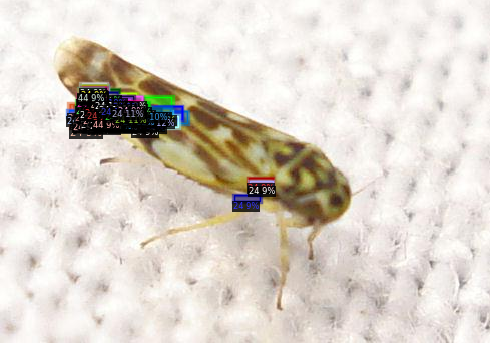

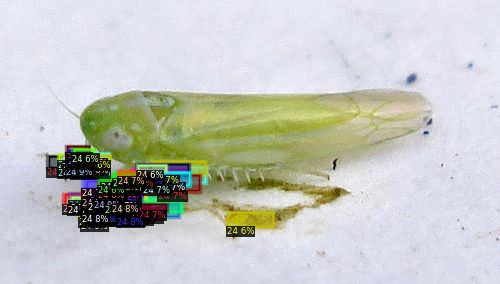

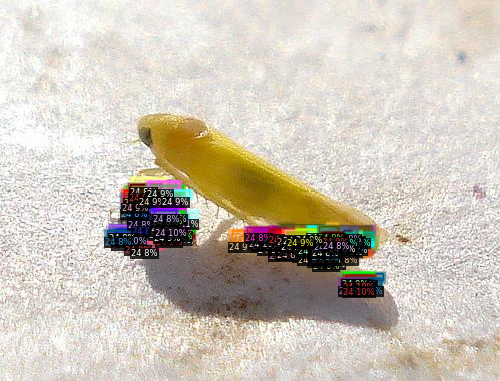

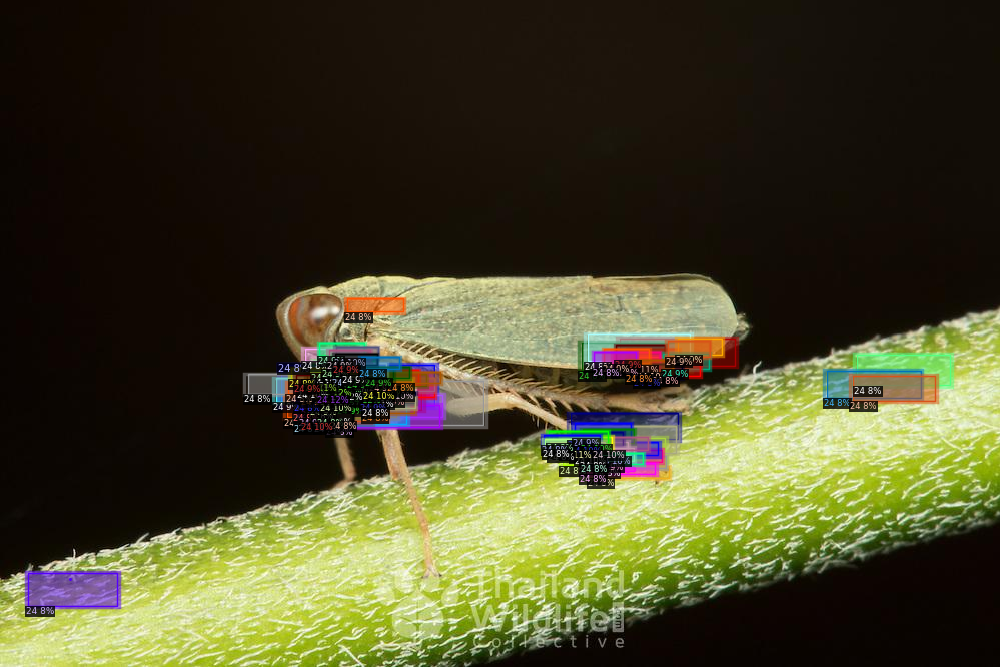

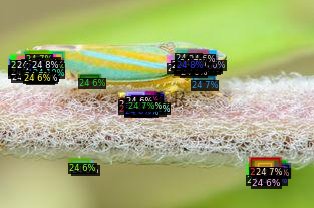

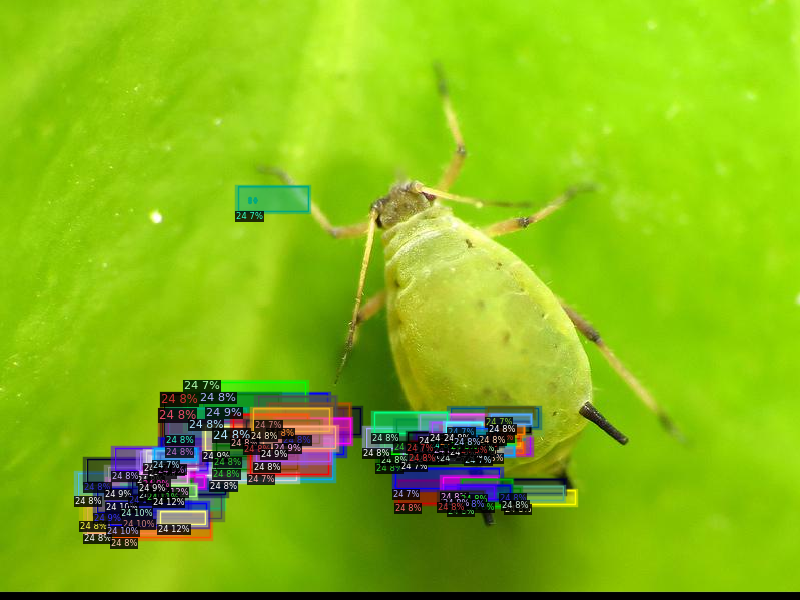

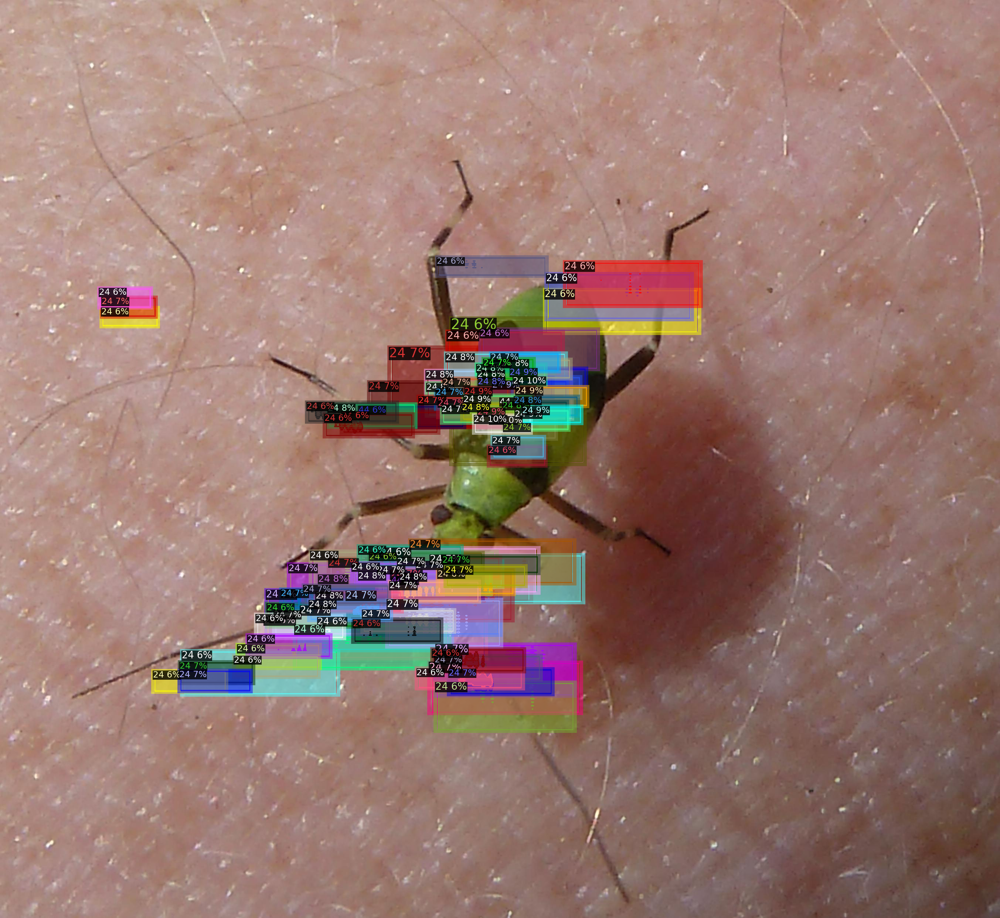

In [ ]:
#Prediction
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor
import os
from detectron2.data import MetadataCatalog
import cv2
from detectron2.utils.visualizer import Visualizer
from google.colab.patches import cv2_imshow
from detectron2 import model_zoo
import random


# path fine-tuned model
model_path = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")

# Load configuration and model weights
cfg = get_cfg()
cfg.merge_from_file(
    model_zoo.get_config_file(
        "COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml"
    )
)
cfg.MODEL.WEIGHTS = model_path
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.01


predictor = DefaultPredictor(cfg)
metadata = MetadataCatalog.get("ip102_test")
image_path = "/content/drive/MyDrive/Colab Notebooks/New Pic/"


image_files = [
    f for f in os.listdir(image_path) if f.lower().endswith((".png", ".jpg", ".jpeg"))
]

# Randomly select 7 images
selected_images = random.sample(image_files, 7)

# Iterate through the selected images
for filename in selected_images:
    img = cv2.imread(os.path.join(image_path, filename))

    if img is not None:
        # Make predictions and visualize
        outputs = predictor(img)
        v = Visualizer(img[:, :, ::-1], metadata=metadata, scale=1.0)
        v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
        cv2_imshow(v.get_image()[:, :, ::-1])
    else:
        print(f"Error: Could not load image {filename}. Please check the file.")

In [ ]:
print(image_path)

/content/drive/MyDrive/Colab Notebooks/New Pic/


In [ ]:
import logging
import json
import os

def evaluate_model():
    output_dir = "./output/inference/"
    os.makedirs(output_dir, exist_ok=True)

    evaluator = COCOEvaluator("ip102_test", cfg, False, output_dir=output_dir)
    # Use build_detection_test_loader instead of build_detection_train_loader
    val_loader = build_detection_test_loader(cfg, "ip102_test", mapper=enhanced_mapper)

    total = len(list(val_loader))
    logger = logging.getLogger(__name__)
    logger.info("Start inference on {} batches".format(total))

    inference_on_dataset(trainer.model, val_loader, evaluator)


    # Debug: Print contents of evaluator
    print("Evaluator contents:", evaluator)

    # Debug: Attempt to manually save results
    try:
        with open(os.path.join(output_dir, "coco_instances_results_manual.json"), "w") as f:
            json.dump(evaluator._predictions, f)  # Access _predictions attribute
    except Exception as e:
        print("Error manually saving results:", e)

    output_file = os.path.join(output_dir, "coco_instances_results.json")
    if os.path.exists(output_file):
        logger.info("Output file exists")
        with open(output_file, "r") as f:
            results = json.load(f)
        logger.info(f"Results: {results}")
    else:
        logger.error("Output file not found!")



In [ ]:

evaluate_model()

WARNING [01/27 23:16:14 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [01/27 23:16:14 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/27 23:16:14 d2.data.datasets.coco]: Loaded 500 images in COCO format from /tmp/tmpd2lemak8/test_annotations.json
[01/27 23:16:14 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[01/27 23:16:14 d2.data.common]: Serializing 500 elements to byte tensors and concatenating them all ...
[01/27 23:16:14 d2.data.common]: Serialized dataset takes 0.13 MiB


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [ ]:
# Visualize Predictions
def visualize_predictions(dataset_dicts, predictor, metadata, num_samples=5, conf_threshold=0.5, class_filter=None):
    import random
    from google.colab.patches import cv2_imshow

    for d in random.sample(dataset_dicts, num_samples):
        img = cv2.imread(d["file_name"])
        outputs = predictor(img)

        # Filter predictions by confidence and class
        instances = outputs["instances"].to("cpu")
        filtered_instances = instances[instances.scores > conf_threshold]
        if class_filter is not None:
            filtered_instances = filtered_instances[filtered_instances.pred_classes == class_filter]

        # Check if any instances are left after filtering
        if len(filtered_instances) > 0:
            print(filtered_instances)  # Print filtered instances for debugging
            visualizer = Visualizer(img[:, :, ::-1], metadata=metadata, scale=0.8)
            vis = visualizer.draw_instance_predictions(filtered_instances)
            cv2_imshow(vis.get_image()[:, :, ::-1])
        else:
            print("No instances found in the image with the specified confidence and class filter.")

[01/26 22:17:27 d2.data.datasets.coco]: Loaded 500 images in COCO format from /content/drive/MyDrive/Colab Notebooks/test_annotations.json
Instances(num_instances=100, image_height=346, image_width=430, fields=[pred_boxes: Boxes(tensor([[330.5335, 303.8362, 366.8448, 304.7266],
        [334.6446, 303.5915, 369.7075, 304.4887],
        [ 42.9167,  30.7744, 106.7259,  31.5324],
        [ 41.8357,  29.7183, 105.7043,  30.4181],
        [330.1508, 302.1110, 367.0226, 303.0062],
        [329.7175, 298.4987, 366.6624, 299.3501],
        [329.8379, 300.3915, 366.7475, 301.2489],
        [344.5381, 302.1080, 380.3100, 302.7765],
        [343.6290, 301.8423, 377.9434, 302.5732],
        [335.0160, 298.8917, 369.4263, 299.7545],
        [335.7344, 296.5742, 371.6264, 297.4202],
        [340.8123, 301.5656, 376.5604, 302.3145],
        [343.2325, 294.7777, 390.5201, 295.3683],
        [344.6509, 296.1047, 389.3681, 296.6786],
        [342.8668, 295.6978, 385.4643, 296.3083],
        [ 39.3779,  2

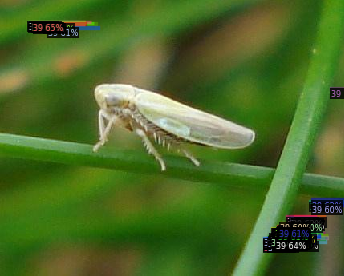

Instances(num_instances=14, image_height=500, image_width=500, fields=[pred_boxes: Boxes(tensor([[ 88.3338, 444.5472, 128.5386, 448.1453],
        [ 91.0174, 447.0924, 130.4468, 450.8839],
        [ 84.9445, 442.5571, 126.0565, 446.1945],
        [ 86.1667, 446.0015, 126.1320, 449.7109],
        [ 88.0242, 439.2177, 127.1507, 442.6844],
        [ 75.7179, 444.6355, 116.8493, 449.6462],
        [126.2401, 445.0783, 162.1070, 448.1548],
        [ 78.9197, 440.2335, 119.1879, 444.4286],
        [129.2279, 444.0486, 164.3746, 447.0843],
        [142.8253, 445.2056, 175.1221, 447.9628],
        [132.5883, 442.8141, 170.4340, 445.6157],
        [132.7715, 441.2965, 164.1455, 448.7750],
        [ 78.5983, 437.9574, 119.1673, 442.0339],
        [128.9999, 441.6758, 164.3999, 444.5970]])), scores: tensor([0.5737, 0.5630, 0.5630, 0.5555, 0.5415, 0.5339, 0.5294, 0.5284, 0.5267,
        0.5183, 0.5058, 0.5044, 0.5040, 0.5018]), pred_classes: tensor([27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 

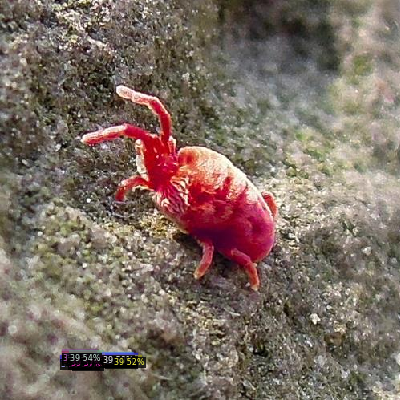

Instances(num_instances=100, image_height=1010, image_width=1515, fields=[pred_boxes: Boxes(tensor([[1425.3790,  894.3010, 1508.8754,  895.8178],
        [1469.1550,  895.1556, 1512.1531,  896.8295],
        [1443.8021,  891.5278, 1510.3700,  893.2150],
        [1427.5648,  890.3284, 1509.2704,  891.7943],
        [1442.5957,  888.1238, 1510.4240,  889.4417],
        [1469.3644,  890.9739, 1512.2585,  892.5999],
        [1429.6953,  887.8661, 1507.9083,  890.1103],
        [1419.9810,  863.8992, 1509.3312,  865.6321],
        [1418.3666,  861.2052, 1509.2213,  862.9119],
        [1415.1777,  866.3694, 1503.4510,  868.2027],
        [1424.9913,  863.2665, 1509.6256,  864.9006],
        [1423.3575,  860.6088, 1509.5028,  862.2176],
        [1420.8177,  867.5558, 1506.4073,  869.4157],
        [1426.7856,  867.0877, 1509.7635,  868.8249],
        [1418.8134,  857.4038, 1509.2534,  859.1148],
        [1427.0256,  885.8393, 1509.4613,  887.1735],
        [1409.4825,  862.6084, 1499.0359,  8

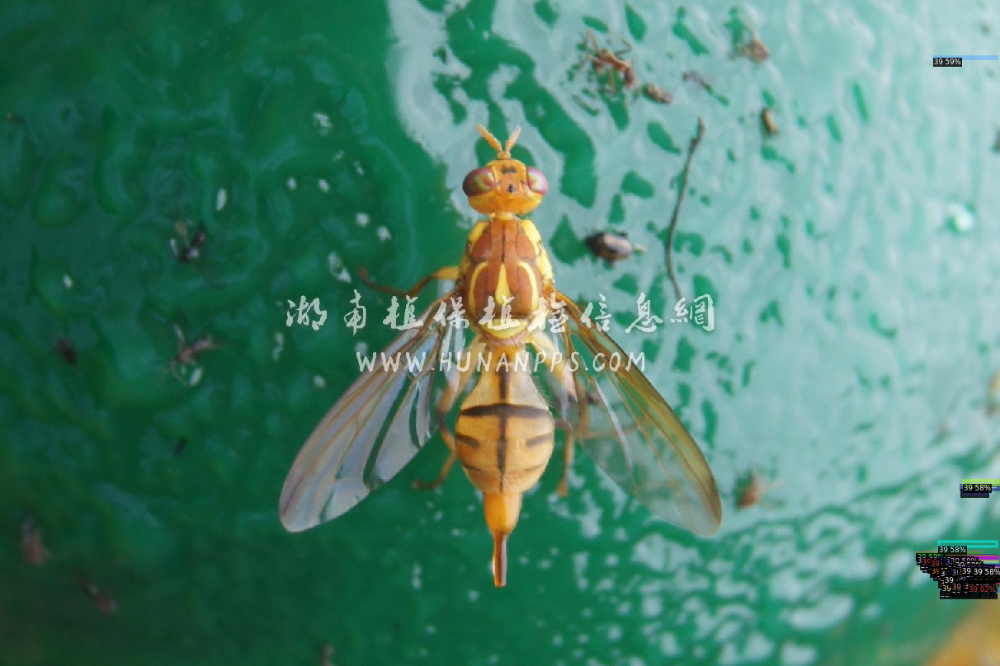

Instances(num_instances=100, image_height=221, image_width=295, fields=[pred_boxes: Boxes(tensor([[249.9318, 195.9155, 270.2061, 196.4531],
        [250.4103, 195.7014, 271.6096, 196.2235],
        [250.3529, 195.5413, 273.3208, 196.0289],
        [250.2620, 194.9997, 271.5837, 195.5063],
        [265.0026, 194.5392, 284.4021, 195.0447],
        [266.2074, 194.3591, 285.1315, 194.8631],
        [263.4740, 194.0769, 283.9348, 194.5620],
        [249.9909, 194.1848, 271.7861, 194.6742],
        [ 99.5126, 195.5560, 122.4309, 196.0535],
        [266.8734, 193.7996, 286.1457, 194.3012],
        [102.5858, 195.3707, 128.3576, 195.9001],
        [268.1027, 193.1306, 287.3523, 193.6365],
        [258.1912, 178.2466, 281.0762, 179.5719],
        [258.5064, 180.3587, 280.4205, 181.7487],
        [265.9868, 192.2528, 286.6767, 192.7744],
        [263.5039, 192.7939, 285.2512, 193.3242],
        [260.5061, 178.6011, 283.3810, 179.9423],
        [101.7149, 194.8469, 124.9242, 195.3491],
        [2

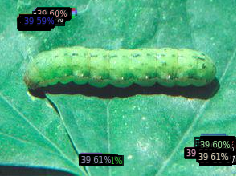

Instances(num_instances=26, image_height=372, image_width=500, fields=[pred_boxes: Boxes(tensor([[401.9574, 291.1485, 464.5334, 293.7285],
        [401.1560, 293.4605, 464.5264, 295.9306],
        [399.8687, 287.7747, 459.5236, 290.3685],
        [399.3398, 291.9031, 458.4637, 294.4376],
        [400.7348, 285.2028, 459.3034, 287.7275],
        [410.7934, 304.4537, 463.6089, 306.8793],
        [ 39.3297, 266.6814,  80.7647, 269.2399],
        [408.1189, 300.9091, 464.7100, 303.2327],
        [ 34.9350, 269.4120,  82.4974, 272.0655],
        [ 42.1507, 265.5216,  83.8413, 267.8647],
        [403.7607, 302.0813, 461.3222, 304.3816],
        [399.1602, 297.7165, 456.9037, 300.0490],
        [407.1259, 306.6538, 460.3297, 309.1259],
        [398.1068, 288.8703, 452.9489, 291.7427],
        [400.4112, 281.6133, 458.2190, 284.0490],
        [410.0105, 308.4990, 458.1235, 311.2545],
        [405.8461, 296.0755, 451.6826, 298.5981],
        [ 43.5356, 251.7529,  92.3078, 254.3733],
        [40

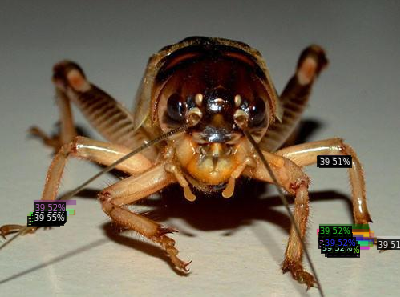

In [ ]:
# Visualize predictions on validation set
visualize_predictions(DatasetCatalog.get("ip102_test"), predictor, MetadataCatalog.get("ip102_test"))

In [ ]:
# plot Training Loss
def plot_training_loss():
    losses = trainer.storage.history("total_loss")._data
    #losses = trainer.storage.history("total_loss").get_values() # Or use get_values() if _data is not available
    plt.plot(range(len(losses)), losses)
    plt.title("Training Loss")
    plt.xlabel("Iterations")
    plt.ylabel("Loss")
    plt.show()

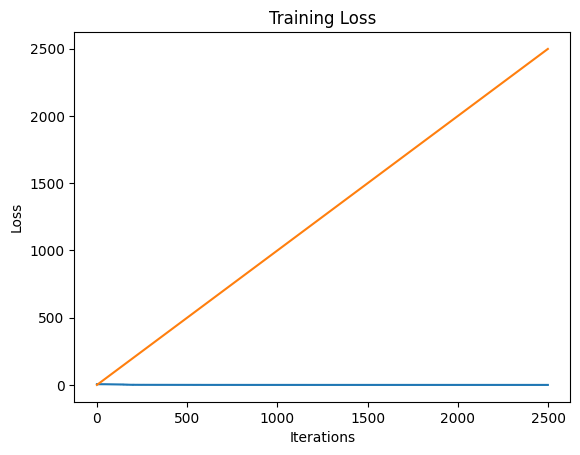

In [ ]:
# Uncomment to plot training loss
plot_training_loss()


# **Debugging Cells**



In [ ]:
print("Dataset categories:", [cat['name'] for cat in data['categories']])


Dataset categories: ['101', '86', '87', '92', '90', '89', '88', '94', '93', '95', '98', '99', '100', '96', '0', '1', '3', '4', '5', '6', '7', '8', '9', '10', '11', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '13', '25', '26', '27', '29', '31', '32', '33', '34', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '50', '51', '53', '54', '55', '56', '57', '58', '61', '62', '64', '66', '67', '68', '69', '70', '71', '73', '74', '76', '77', '78', '79', '81', '82', '65', '35', '30', '83', '84', '85', '97', '72', '91', '12', '28', '2']


In [ ]:
img = cv2.imread(dataset_dicts[0]["file_name"])
outputs = predictor(img)
print(outputs["instances"])

Instances(num_instances=0, image_height=534, image_width=800, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64), pred_masks: tensor([], device='cuda:0', size=(0, 534, 800), dtype=torch.bool)])


In [ ]:
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(data['categories'])
cfg.MODEL.ROI_HEADS.NUM_CLASSES

73

In [ ]:
from detectron2.data import DatasetCatalog

dataset_dicts = DatasetCatalog.get("ip102_test")
print(len(dataset_dicts))  # Check the number of images
print(dataset_dicts[0])  # Inspect the first image's annotations

WARNING [01/22 09:30:21 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/22 09:30:21 d2.data.datasets.coco]: Loaded 4023 images in COCO format from /content/drive/MyDrive/Colab Notebooks/test_annotations_fixed.json
4023
{'file_name': '/content/drive/MyDrive/Colab Notebooks/JPEGImages/IP102001974.jpg', 'height': 534, 'width': 800, 'image_id': 0, 'annotations': [{'iscrowd': 0, 'bbox': [225, 113, 421, 386], 'category_id': 1, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}


In [ ]:
cfg = predictor.cfg
print(cfg.MODEL.ROI_HEADS.NUM_CLASSES)  # Should match the number of categories

NameError: name 'predictor' is not defined

In [ ]:
#cfg.MODEL.ROI_HEADS.NUM_CLASSES = 85
num_categories = len(data['categories'])
print(f"Number of categories: {num_categories}")


Number of categories: 96


In [ ]:
from detectron2.data.datasets import register_coco_instances

register_coco_instances(
    "ip102_val", {},
    "/content/drive/MyDrive/Colab Notebooks/test_annotations_fixed.json",
    "/content/drive/MyDrive/Colab Notebooks/JPEGImages/"
)


In [ ]:
import json

# Load your dataset
with open('/content/drive/MyDrive/Colab Notebooks/test_annotations_fixed.json', 'r') as f:
    data = json.load(f)

# Extract valid category IDs
valid_category_ids = {cat["id"] for cat in data["categories"]}

# Find invalid category IDs in annotations
invalid_category_ids = set()
for ann in data["annotations"]:
    if ann["category_id"] not in valid_category_ids:
        invalid_category_ids.add(ann["category_id"])

print(f"Invalid category IDs: {invalid_category_ids}")


Invalid category IDs: set()


In [ ]:
import json

# Load the dataset
with open('/content/drive/MyDrive/Colab Notebooks/test_annotations.json', 'r') as f:
    data = json.load(f)

# Shift category_id values in annotations
for ann in data["annotations"]:
    ann["category_id"] += 1

# Shift category_id values in the categories section
for cat in data["categories"]:
    cat["id"] += 1

# Save the fixed dataset
with open('/content/drive/MyDrive/Colab Notebooks/test_annotations.json', 'w') as f:
    json.dump(data, f)

print("Dataset fixed: category_id values shifted by +1.")


Dataset fixed: category_id values shifted by +1.


In [ ]:
# Reload the fixed dataset
with open('/content/drive/MyDrive/Colab Notebooks/test_annotations.json', 'r') as f:
    fixed_data = json.load(f)

# Check all category IDs in annotations
used_category_ids = {ann["category_id"] for ann in fixed_data["annotations"]}
print(f"Used category IDs: {used_category_ids}")

# Verify no invalid category IDs
invalid_category_ids = [cid for cid in used_category_ids if cid <= 0]
print(f"Invalid category IDs: {invalid_category_ids}")  # Should output an empty list


Used category IDs: {2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97}
Invalid category IDs: []


In [ ]:
from detectron2.data import DatasetCatalog

dataset_dicts = DatasetCatalog.get("ip102_val")
print(f"Number of images: {len(dataset_dicts)}")
print(f"First image: {dataset_dicts[0]}")


WARNING [01/20 22:29:19 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/20 22:29:19 d2.data.datasets.coco]: Loaded 4023 images in COCO format from /content/drive/MyDrive/Colab Notebooks/test_annotations.json
Number of images: 4023
First image: {'file_name': '/content/drive/MyDrive/Colab Notebooks/JPEGImages/IP102001974.jpg', 'height': 534, 'width': 800, 'image_id': 0, 'annotations': [{'iscrowd': 0, 'bbox': [225, 113, 421, 386], 'category_id': 0, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}


In [ ]:
import json

# Load the dataset
with open('/content/drive/MyDrive/Colab Notebooks/test_annotations.json', 'r') as f:
    data = json.load(f)

# Check for category_id=0 in annotations
invalid_annotations = [ann for ann in data["annotations"] if ann["category_id"] == 0]
print(f"Annotations with category_id=0: {len(invalid_annotations)}")

# Check for valid category IDs
used_category_ids = {ann["category_id"] for ann in data["annotations"]}
print(f"Used category IDs: {used_category_ids}")


Annotations with category_id=0: 0
Used category IDs: {2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97}


In [ ]:
# Shift category_id values in annotations
for ann in data["annotations"]:
    ann["category_id"] += 1

# Shift category_id in the categories section
for cat in data["categories"]:
    cat["id"] += 1

# Save the fixed dataset
with open('/content/drive/MyDrive/Colab Notebooks/test_annotations.json', 'w') as f:
    json.dump(data, f)

print("Dataset fixed successfully.")


Dataset fixed successfully.


In [ ]:
from detectron2.data.datasets import register_coco_instances

register_coco_instances(
    "ip102_val", {},
    "/content/drive/MyDrive/Colab Notebooks/test_annotations.json",  # Use the updated file
    "/content/drive/MyDrive/Colab Notebooks/JPEGImages/"
)


In [ ]:
from detectron2.data import DatasetCatalog, MetadataCatalog

# Remove the old dataset
if "ip102_val" in DatasetCatalog.list():
    DatasetCatalog.remove("ip102_val")
if "ip102_val" in MetadataCatalog.list():
    MetadataCatalog.remove("ip102_val")


In [ ]:
from detectron2.data.datasets import register_coco_instances


register_coco_instances(
    "ip102_val",
    {},
    "/content/drive/MyDrive/Colab Notebooks/test_annotations.json",
    "/content/drive/MyDrive/Colab Notebooks/JPEGImages/"
)
print("Dataset 'ip102_val' registered successfully.")


Dataset 'ip102_val' registered successfully.


In [ ]:
from detectron2.data import DatasetCatalog

dataset_dicts = DatasetCatalog.get("ip102_val")
print(f"Number of images: {len(dataset_dicts)}")
print(f"First image: {dataset_dicts[0]}")


WARNING [01/20 22:36:08 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/20 22:36:08 d2.data.datasets.coco]: Loaded 4023 images in COCO format from /content/drive/MyDrive/Colab Notebooks/test_annotations.json
Number of images: 4023
First image: {'file_name': '/content/drive/MyDrive/Colab Notebooks/JPEGImages/IP102001974.jpg', 'height': 534, 'width': 800, 'image_id': 0, 'annotations': [{'iscrowd': 0, 'bbox': [225, 113, 421, 386], 'category_id': 0, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}


In [ ]:
from detectron2.data import DatasetCatalog

dataset_dicts = DatasetCatalog.get("ip102_val")
print(f"Number of images: {len(dataset_dicts)}")
print(f"First image: {dataset_dicts[0]}")


AssertionError: Attribute 'thing_dataset_id_to_contiguous_id' in the metadata of 'ip102_val' cannot be set to a different value!
{0: 0, 1: 1, 2: 2, 3: 3, 4: 4, 5: 5, 6: 6, 7: 7, 8: 8, 9: 9, 10: 10, 11: 11, 12: 12, 13: 13, 14: 14, 15: 15, 16: 16, 17: 17, 18: 18, 19: 19, 20: 20, 21: 21, 22: 22, 23: 23, 24: 24, 25: 25, 26: 26, 27: 27, 28: 28, 29: 29, 30: 30, 31: 31, 32: 32, 33: 33, 34: 34, 35: 35, 36: 36, 37: 37, 38: 38, 39: 39, 40: 40, 41: 41, 42: 42, 43: 43, 44: 44, 45: 45, 46: 46, 47: 47, 48: 48, 49: 49, 50: 50, 51: 51, 52: 52, 53: 53, 54: 54, 55: 55, 56: 56, 57: 57, 58: 58, 59: 59, 60: 60, 61: 61, 62: 62, 63: 63, 64: 64, 65: 65, 66: 66, 67: 67, 68: 68, 69: 69, 70: 70, 71: 71, 72: 72, 73: 73, 74: 74, 75: 75, 76: 76, 77: 77, 78: 78, 79: 79, 80: 80, 81: 81, 82: 82, 83: 83, 84: 84, 85: 85, 86: 86, 87: 87, 88: 88, 89: 89, 90: 90, 91: 91, 92: 92, 93: 93, 94: 94, 95: 95} != {1: 0, 2: 1, 3: 2, 4: 3, 5: 4, 6: 5, 7: 6, 8: 7, 9: 8, 10: 9, 11: 10, 12: 11, 13: 12, 14: 13, 15: 14, 16: 15, 17: 16, 18: 17, 19: 18, 20: 19, 21: 20, 22: 21, 23: 22, 24: 23, 25: 24, 26: 25, 27: 26, 28: 27, 29: 28, 30: 29, 31: 30, 32: 31, 33: 32, 34: 33, 35: 34, 36: 35, 37: 36, 38: 37, 39: 38, 40: 39, 41: 40, 42: 41, 43: 42, 44: 43, 45: 44, 46: 45, 47: 46, 48: 47, 49: 48, 50: 49, 51: 50, 52: 51, 53: 52, 54: 53, 55: 54, 56: 55, 57: 56, 58: 57, 59: 58, 60: 59, 61: 60, 62: 61, 63: 62, 64: 63, 65: 64, 66: 65, 67: 66, 68: 67, 69: 68, 70: 69, 71: 70, 72: 71, 73: 72, 74: 73, 75: 74, 76: 75, 77: 76, 78: 77, 79: 78, 80: 79, 81: 80, 82: 81, 83: 82, 84: 83, 85: 84, 86: 85, 87: 86, 88: 87, 89: 88, 90: 89, 91: 90, 92: 91, 93: 92, 94: 93, 95: 94, 96: 95}

In [ ]:
# Reload the updated dataset
with open('/content/drive/MyDrive/Colab Notebooks/test_annotations_fixed.json', 'r') as f:
    updated_data = json.load(f)

# Verify that no annotations have category_id=86
used_category_ids = {ann["category_id"] for ann in updated_data["annotations"]}
valid_category_ids = {cat["id"] for cat in updated_data["categories"]}
invalid_category_ids = used_category_ids - valid_category_ids

print(f"Remaining invalid category IDs: {invalid_category_ids}")  # Should output an empty set


Remaining invalid category IDs: set()
